# The purpose of this is to provide a time-series forecast model to predict if the number of positives a country/territory will receive within the next number of days will increase or decrease

> data from: https://www.ecdc.europa.eu/en/publications-data/download-todays-data-geographic-distribution-covid-19-cases-worldwide

In [3]:
# Import custom Time_Series python library with function definitions and other imports
%run ./Time_Series.ipynb

In [4]:
start_date = pd.to_datetime('07/06/2020') # start of test data
end_date = pd.to_datetime('07/21/2020') # end of test data
k = 17 # number of n-day components
n = 5 # n in n-day averages

## Read, Mungle, and Plot Data

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


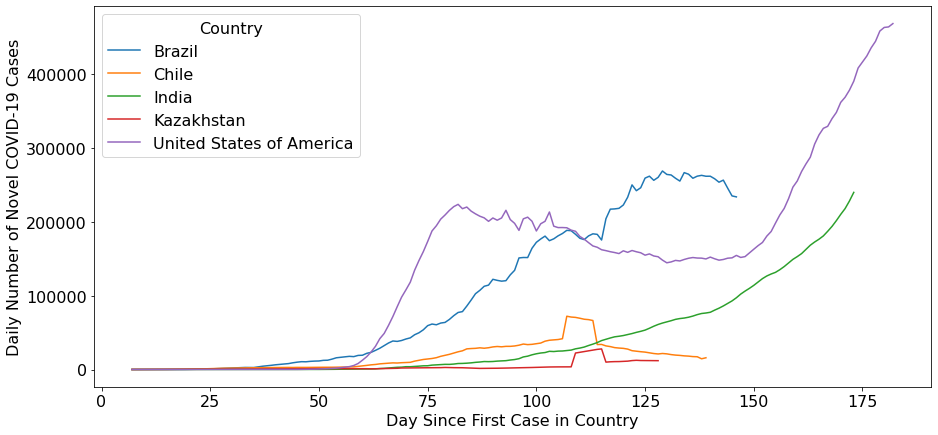

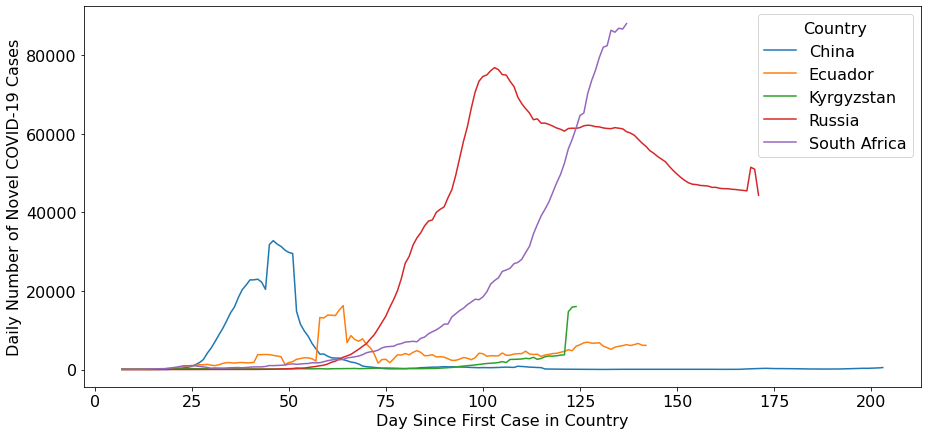

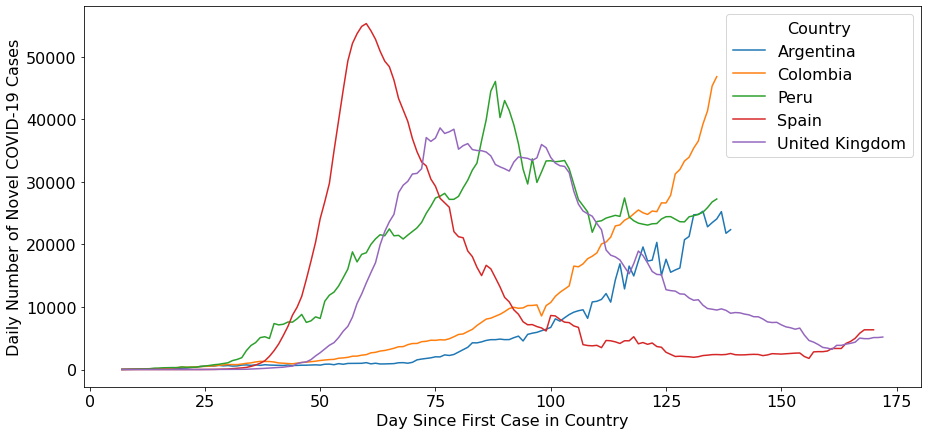

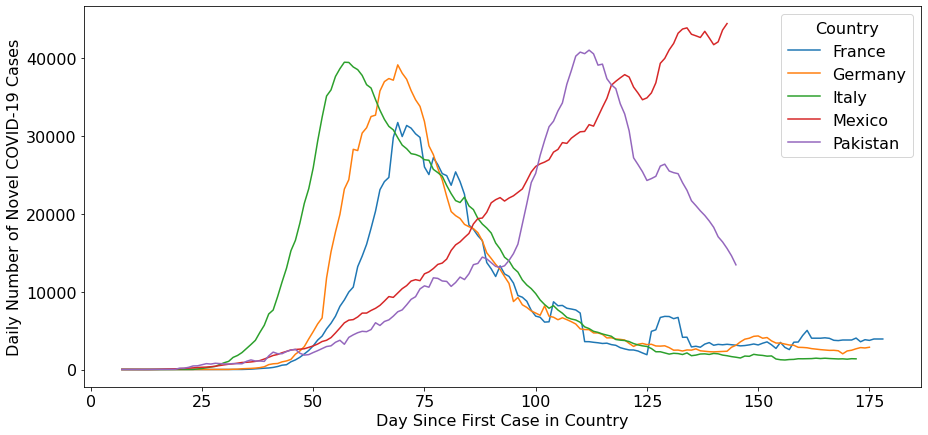

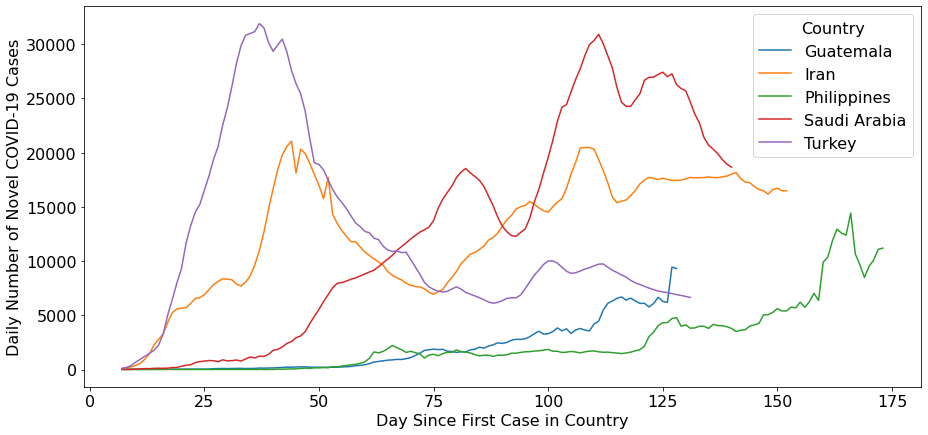

...

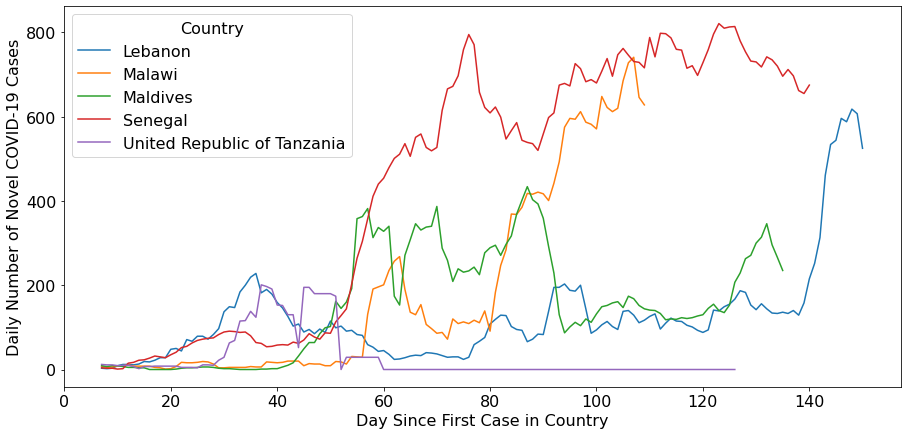

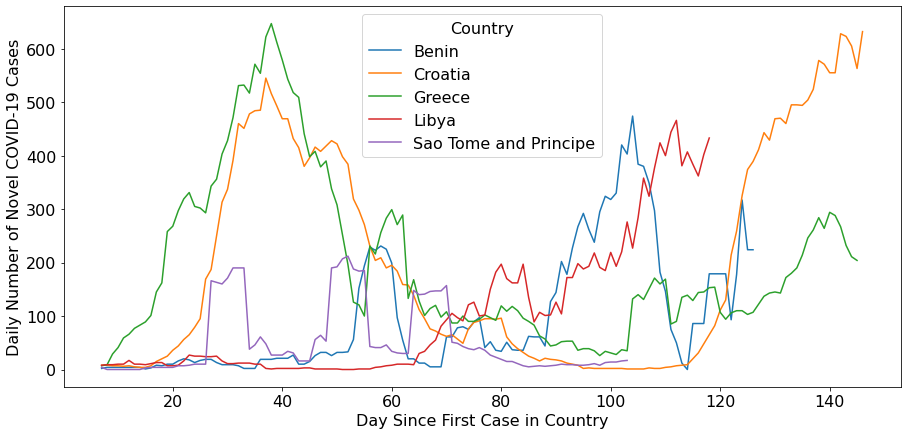

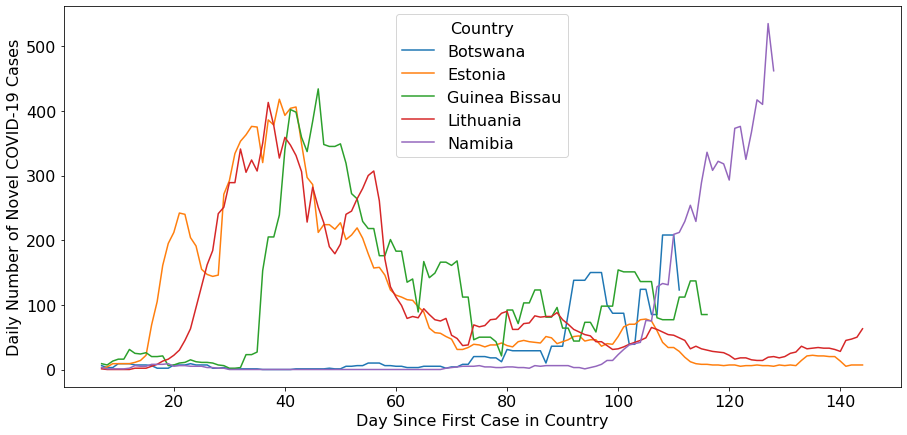

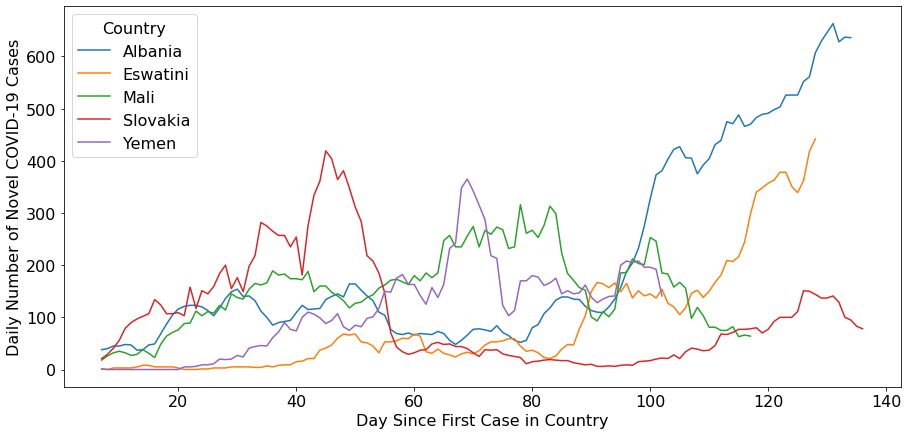

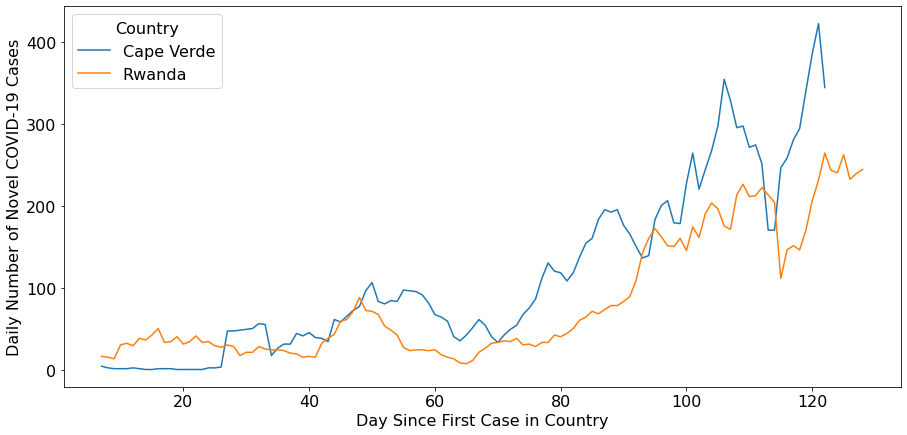

In [5]:
data = readCOVID19('COVID-19_cases_20200721.csv', cases_max=100)
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 16})
plot5(moving_sum(data, 7))

In [16]:
samples['train']['dates']

[[Timestamp('2020-01-26 00:00:00'),
  Timestamp('2020-01-31 00:00:00'),
  Timestamp('2020-02-05 00:00:00'),
  Timestamp('2020-02-10 00:00:00'),
  Timestamp('2020-02-15 00:00:00'),
  Timestamp('2020-02-20 00:00:00'),
  Timestamp('2020-02-25 00:00:00'),
  Timestamp('2020-03-01 00:00:00'),
  Timestamp('2020-03-06 00:00:00'),
  Timestamp('2020-03-11 00:00:00'),
  Timestamp('2020-03-16 00:00:00'),
  Timestamp('2020-03-21 00:00:00'),
  Timestamp('2020-03-26 00:00:00'),
  Timestamp('2020-03-31 00:00:00'),
  Timestamp('2020-04-05 00:00:00'),
  Timestamp('2020-04-10 00:00:00'),
  Timestamp('2020-04-15 00:00:00'),
  Timestamp('2020-04-20 00:00:00')],
 [Timestamp('2020-01-31 00:00:00'),
  Timestamp('2020-02-05 00:00:00'),
  Timestamp('2020-02-10 00:00:00'),
  Timestamp('2020-02-15 00:00:00'),
  Timestamp('2020-02-20 00:00:00'),
  Timestamp('2020-02-25 00:00:00'),
  Timestamp('2020-03-01 00:00:00'),
  Timestamp('2020-03-06 00:00:00'),
  Timestamp('2020-03-11 00:00:00'),
  Timestamp('2020-03-16 00:

In [77]:
from sklearn.metrics import r2_score
samples = {}
samples['train'] = prepare_MLA(data, window_size=n, lags=k, sample_name='train'
                            ,outputs=1, label_type='next', deriv=False, end_date=start_date)
samples['test'] = prepare_MLA(data, window_size=n, lags=k, sample_name='test'
                            ,outputs=1, label_type='next', deriv=False, start_date=start_date, end_date=end_date)
ml = ElasticNet(fit_intercept=False)
ml.fit(samples['train']['Xs'], samples['train']['Ys'])
preds = ml.predict(samples['test']['Xs'])
truths = samples['test']['Ys']
r2 = r2_score(truths, preds)
r2

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210432538.3396665, tolerance: 2657070.3534719995
  positive)


0.986013647451973

In [79]:
results_arr = []
countries = []
with open('results_k_' + str(k) + '_n_' + str(n) + '.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    for r in range(len(truths)):
        countries.append(samples['test']['countries'][r])
        results_arr.append([samples['test']['countries'][r], samples['test']['days'][r][-1]
                         , samples['test']['dates'][r][-1], truths[r][0], preds[r]])
        print([samples['test']['countries'][r], samples['test']['days'][r][-1]
                         , samples['test']['dates'][r][-1], truths[r][0], preds[r]])
        writer.writerow([samples['test']['countries'][r], samples['test']['days'][r][-1]
                         , samples['test']['dates'][r][-1], truths[r][0], preds[r]])
countries = sorted(set(countries))

['United States of America', 171, Timestamp('2020-07-09 00:00:00'), 61768.8, 60841.69757604012]
['United States of America', 176, Timestamp('2020-07-14 00:00:00'), 68554.6, 72213.12292316806]
['Brazil', 134, Timestamp('2020-07-08 00:00:00'), 43313.2, 40733.28051241477]
['Brazil', 139, Timestamp('2020-07-13 00:00:00'), 34460.2, 44702.327959561604]
['India', 163, Timestamp('2020-07-10 00:00:00'), 27891.2, 26045.83461664155]
['India', 168, Timestamp('2020-07-15 00:00:00'), 34173.2, 29515.633204977195]
['Chile', 125, Timestamp('2020-07-06 00:00:00'), 2873.8, 1903.5676881912232]
['Chile', 130, Timestamp('2020-07-11 00:00:00'), 2655.4, 328.7712243287074]
['Chile', 135, Timestamp('2020-07-16 00:00:00'), 2287.4, 2904.834980200421]
['Kazakhstan', 116, Timestamp('2020-07-08 00:00:00'), 1714.0, 797.2509808010972]
['Kazakhstan', 121, Timestamp('2020-07-13 00:00:00'), 1728.4, 3427.4879708470967]
['China', 193, Timestamp('2020-07-10 00:00:00'), 44.4, 13.468824375693316]
['China', 198, Timestamp('202

In [80]:
weights = ml.coef_
with open('weights_k_' + str(k) + '_n_' + str(n) + '.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    for r in range(len(weights)):
        print([len(weights)-r, weights[r]])
        writer.writerow([len(weights)-r, weights[r]])

[17, -0.029300881326985818]
[16, 0.1389846702431683]
[15, 0.1315512816703549]
[14, 0.04309011841306179]
[13, -0.31904154647161753]
[12, 0.026522163037797773]
[11, 0.34350937618985783]
[10, -0.1343874859303072]
[9, 0.05546086697687761]
[8, -0.32130925600854304]
[7, 0.34557392304056317]
[6, -0.013019345178267553]
[5, -0.3738785131365251]
[4, -0.08912272610670768]
[3, 0.42942262832387773]
[2, -0.18433178578191994]
[1, 1.1062393284920422]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.


Text(0.5, 1.0, 'EN-CoF 5-day mean forecasts, R^2=0.986')

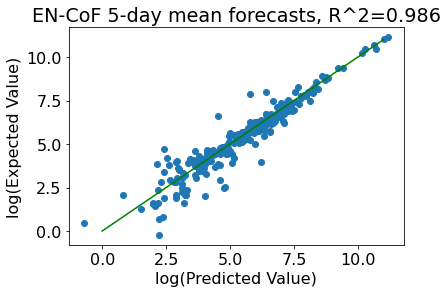

In [81]:
plt.scatter(np.log(preds), np.log(truths))
plt.plot([x for x in range(12)], [x for x in range(12)], color='green')
plt.xlabel('log(Predicted Value)')
plt.ylabel('log(Expected Value)')
plt.title('EN-CoF ' + str(n) + '-day mean forecasts, R^2=' + str(round(r2, 4)))

In [20]:
def convert(s):
    splits = s.split('-')
    year = splits[0]
    month = splits[1]
    day = splits[2]
    if month == '01': month = 'Jan'
    if month == '02': month = 'Feb'
    if month == '03': month = 'Mar'
    if month == '04': month = 'Apr'
    if month == '05': month = 'May'
    if month == '06': month = 'Jun'
    if month == '07': month = 'Jul'
    if month == '08': month = 'Aug'
    if month == '09': month = 'Sep'
    if month == '10': month = 'Oct'
    if month == '11': month = 'Nov'
    if month == '12': month = 'Dec'
    return month + ' ' + day + ', ' + year

In [21]:
def show_country_ts(country, sample, data, results_arr):
    rs = []
    for idx, c in enumerate(sample['countries']):
        if c == country:
            rs.append(idx)
    aves = sample['Xs'][rs[0]].copy()
    dates = sample['dates'][rs[0]][0:-1].copy()
    preds = []
    for r in rs:
        aves += sample['Ys'][r]
        dates += [sample['dates'][r][-1]]
        preds += [results_arr[r][4]]
    raws = data[data['Country'] == country][data['Date'] >= dates[0]]['Cases'].to_numpy()[0:n*len(aves)]
    fig = plt.figure(figsize=(15,10))
    axes= fig.add_axes([0.1,0.1,0.8,0.8])
    x = []
    for d in dates:
        x = x + [convert(str(d.strftime('%Y-%m-%d')))] + ['' for _ in range(n-1)] 
    for idx, ave in enumerate(aves):
        if idx == 0:
            axes.plot([_ for _ in range(idx*n, idx*n+n, 1)], [ave for _ in range(n)], color='green', linewidth=4, label='Expected ' + str(n) + '-day Average')
        else:
            axes.plot([_ for _ in range(idx*n, idx*n+n, 1)], [ave for _ in range(n)], color='green', linewidth=4)
    axes.scatter([_ for _ in range(len(raws))], raws, color='blue', label='Raw Daily Count')
    for idx, pred in enumerate(preds):
        if idx == 0:
            axes.plot([_ for _ in range(k*n, k*n+n, 1)], [pred for _ in range(n)], color='red', linewidth=4, label='Forecasted ' + str(n) + '-day Average')
        else:
            axes.plot([_ for _ in range(k*n + idx*n, k*n+n + idx*n, 1)], [pred for _ in range(n)], color='red', linewidth=4)
    axes.legend()#loc='center left', bbox_to_anchor=(1, 0.5))
    plt.xticks([_ for _ in range(len(raws))], x, rotation='vertical')
    plt.ylabel('Daily COVID-19 Cases')
    plt.title('Raw daily counts versus ' + str(n) + '-day average, ' + country)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


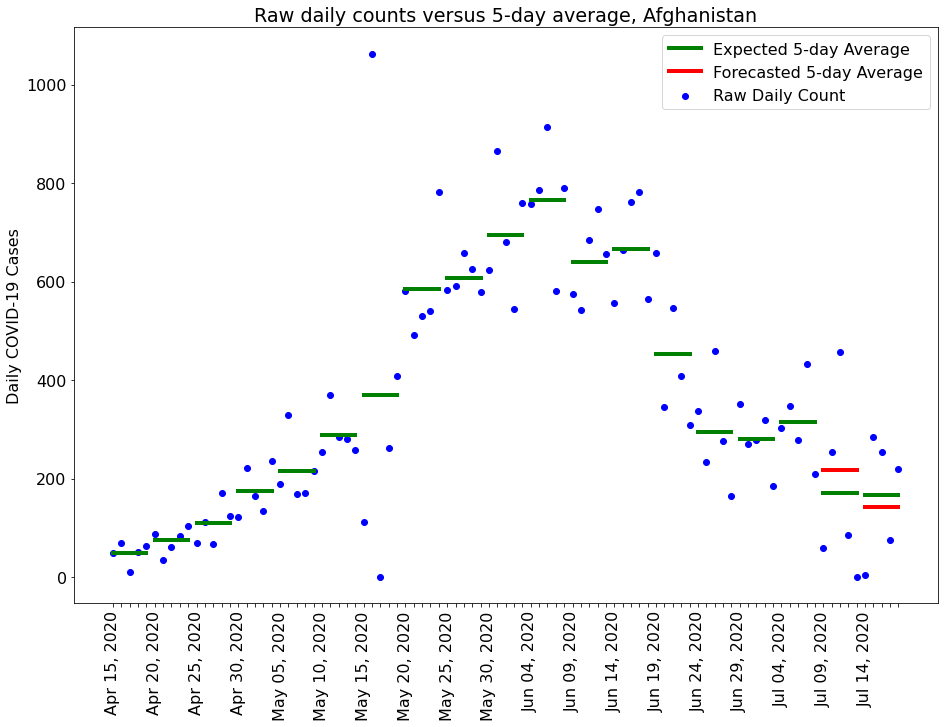

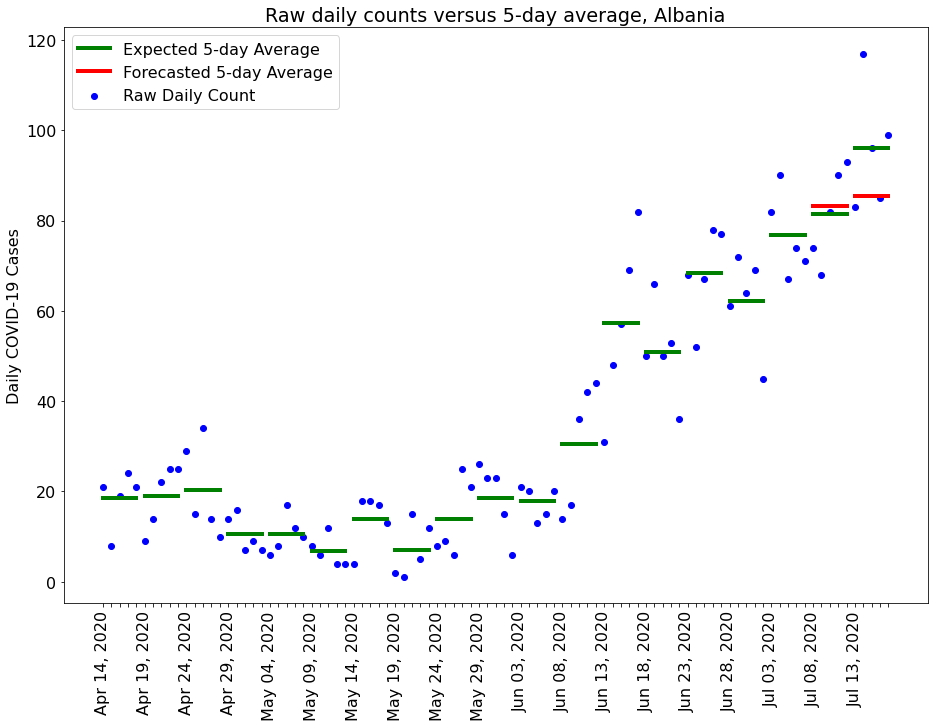

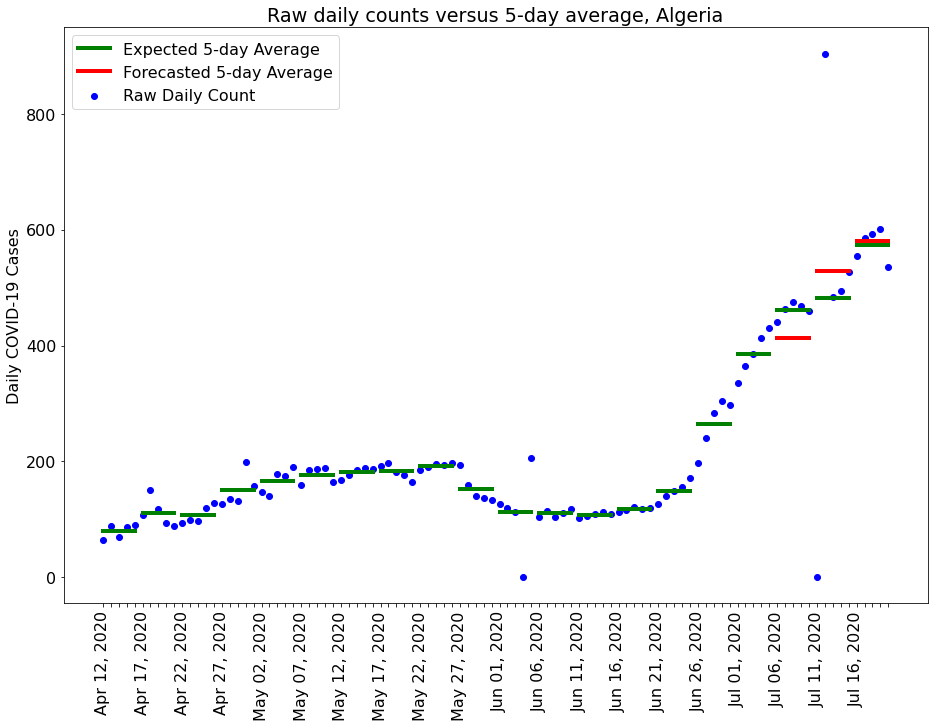

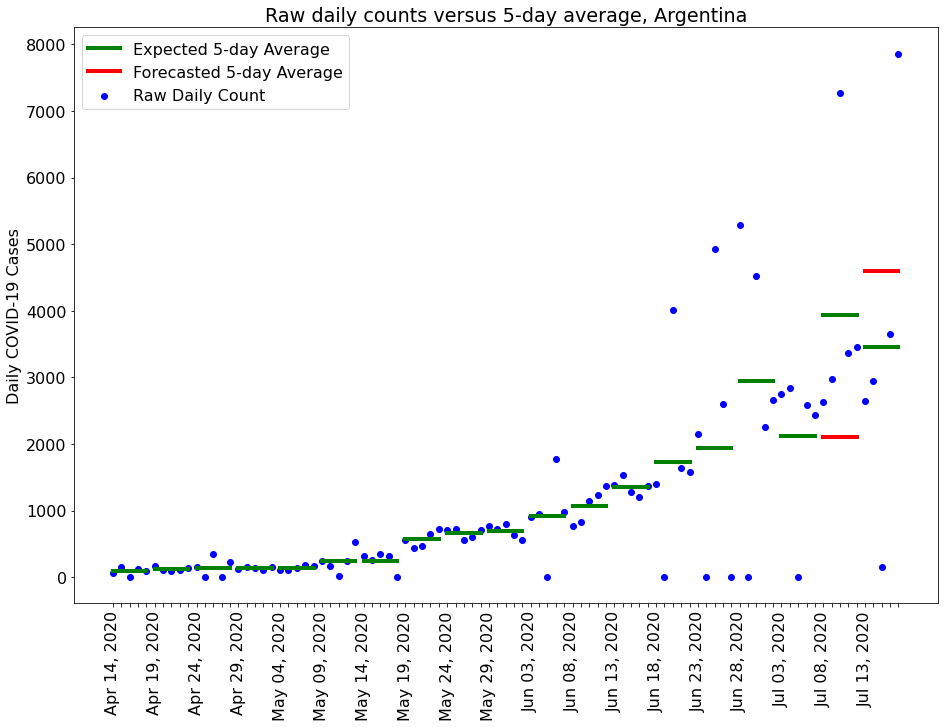

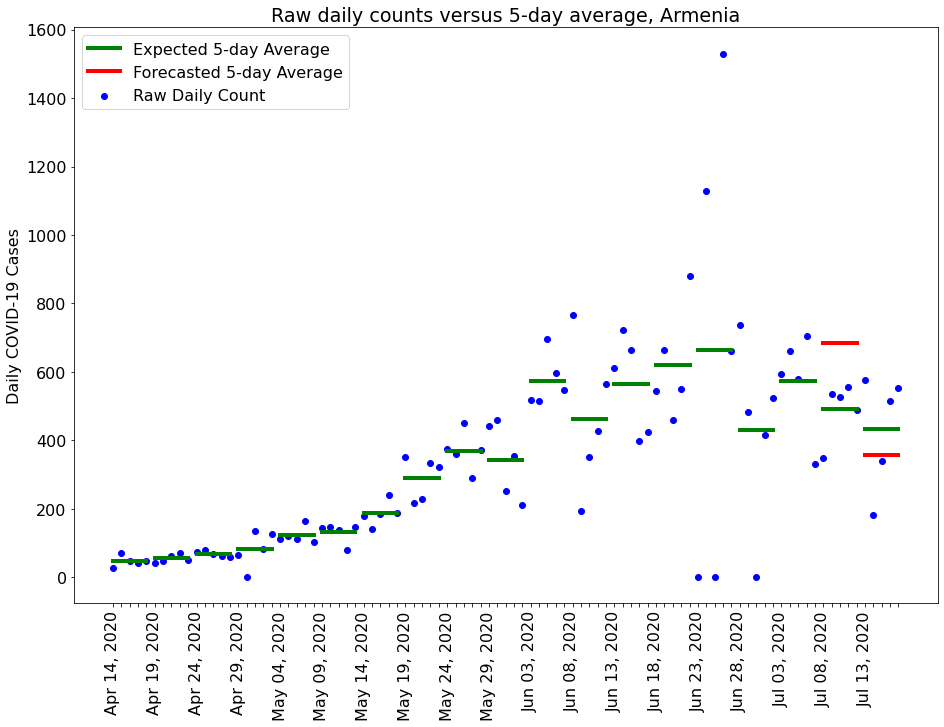

...

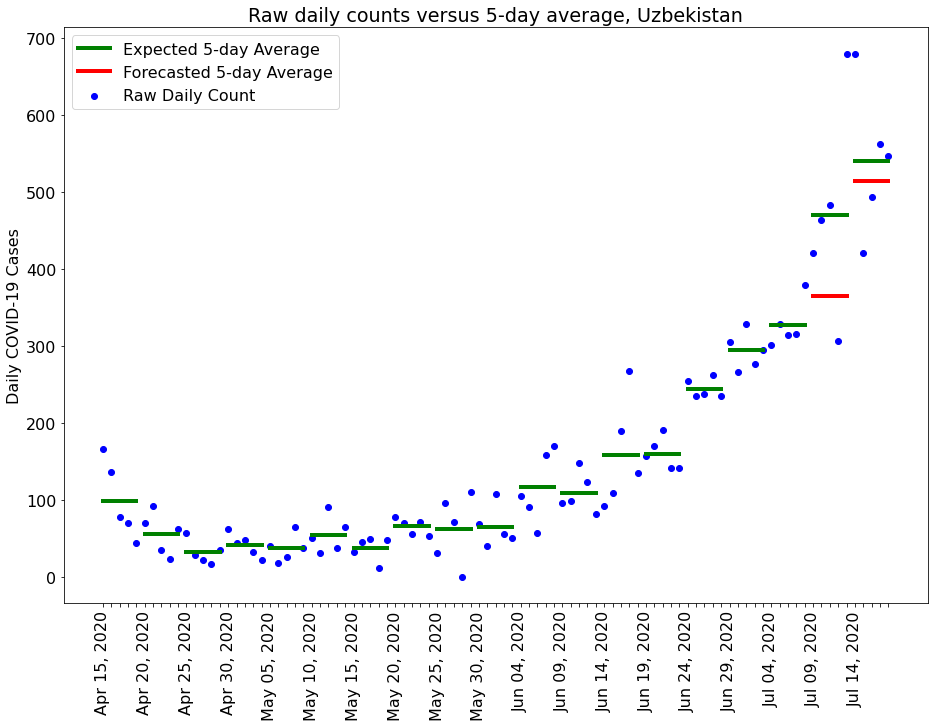

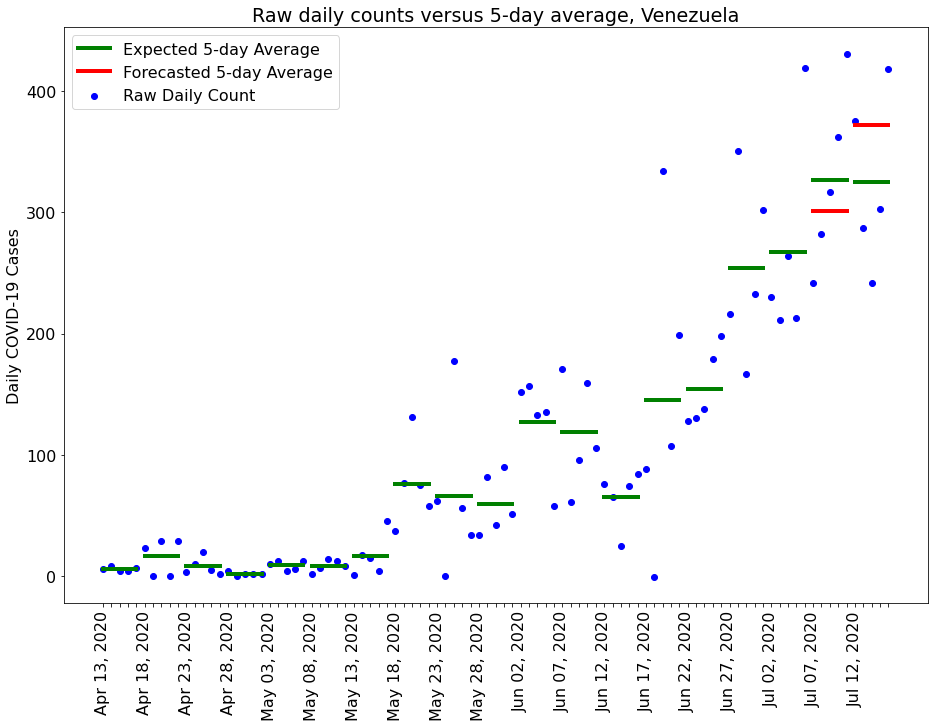

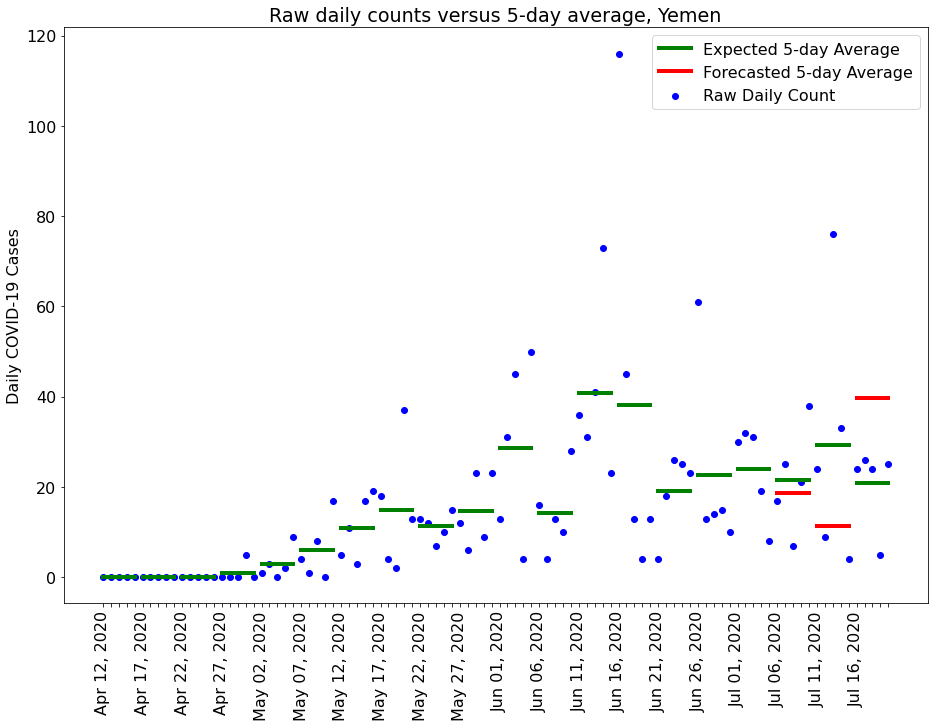

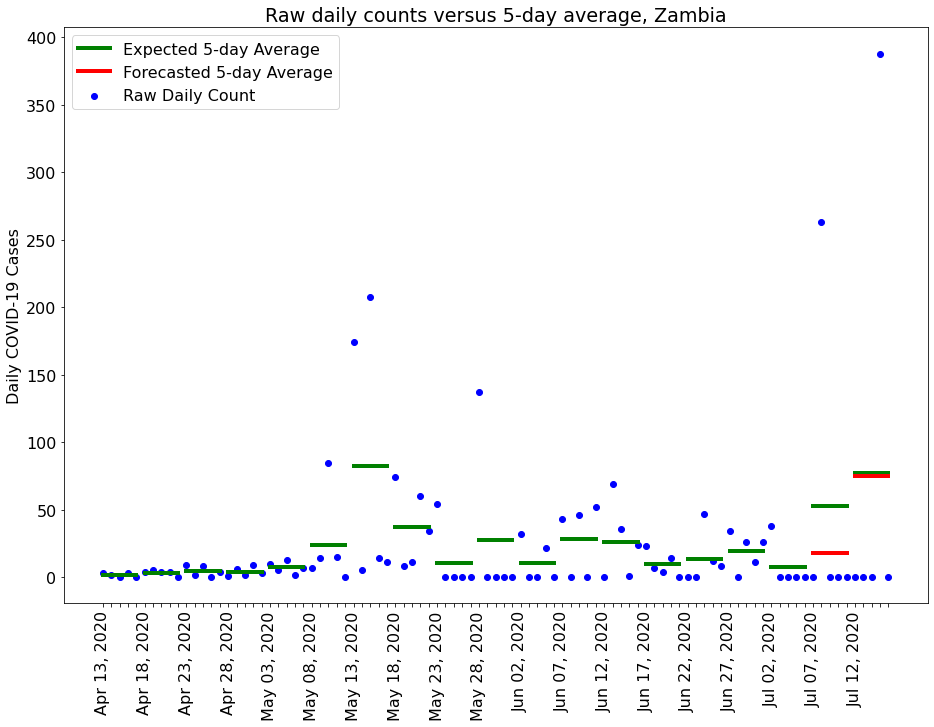

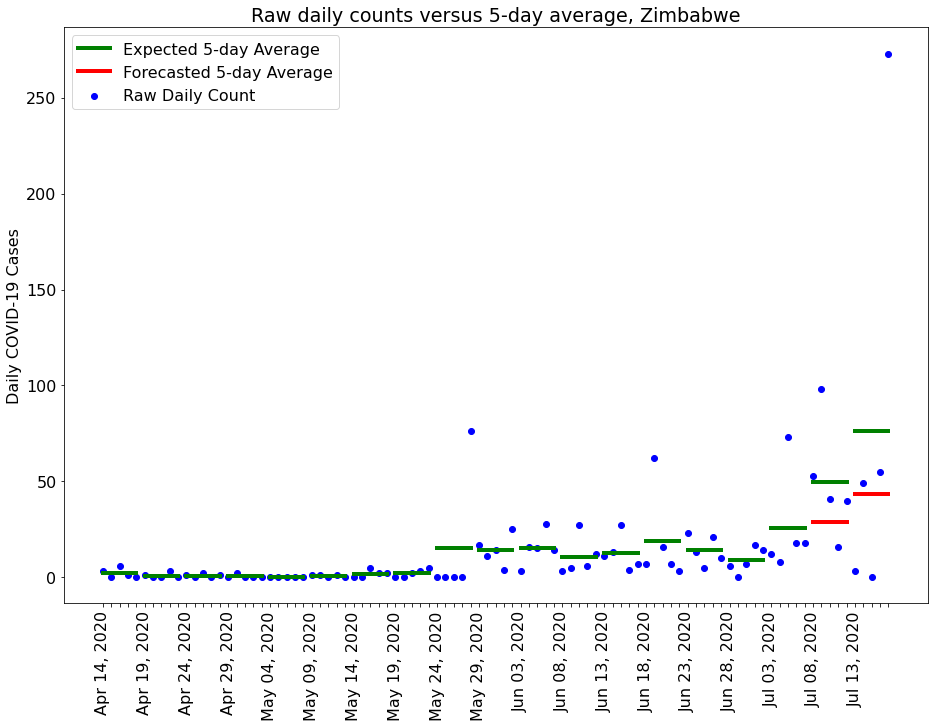

In [22]:
for country in countries:
    show_country_ts(country, samples['test'], data, results_arr)

In [52]:
test_dates = {}
for idx, country, in enumerate(samples['test']['countries']):
    test_date = samples['test']['dates'][idx][-1]
    if country not in test_dates:
        test_dates[country] = []
    test_dates[country].append(test_date)

C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


170 of 17946 54998.262246681355 61768.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


175 of 17946 69311.0430880006 68554.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


315 of 17946 37342.421591686776 43313.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


320 of 17946 36445.690775666655 34460.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


490 of 17946 27581.508052165416 27891.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


495 of 17946 30732.25795831056 34173.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


625 of 17946 3087.7631871826425 2873.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


630 of 17946 2808.527409698221 2655.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


635 of 17946 2781.87076862935 2287.4
755 of 17946 2626.415548452458 1714.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


760 of 17946 1560.3039151723192 1728.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


960 of 17946 170.38457795488227 44.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


965 of 17946 186.57730323059147 62.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1095 of 17946 11090.713137390996 11692.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1100 of 17946 13212.80856646287 12007.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1265 of 17946 6533.774914757735 6537.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1270 of 17946 6412.138039594749 6486.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1410 of 17946 496.6329066417725 847.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1415 of 17946 703.6883989475773 984.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1530 of 17946 641.5677573257508 396.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1535 of 17946 415.6631573075818 523.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1540 of 17946 551.4880802541039 3033.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1705 of 17946 710.9905030755555 712.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1710 of 17946 1005.4966779594839 727.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1840 of 17946 3829.440736408012 5117.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1845 of 17946 5418.989785376145 7294.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1975 of 17946 3591.5735293686 3409.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


1980 of 17946 3092.117958128199 3842.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2145 of 17946 -4931.649103849559 543.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2150 of 17946 -3467.948740858531 755.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2285 of 17946 1938.2565683654489 3941.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2290 of 17946 2304.317885604279 3449.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2430 of 17946 5802.261992845914 5886.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2435 of 17946 6861.548546066656 6895.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2605 of 17946 391.7774532746201 758.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2610 of 17946 793.018169975616 510.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2750 of 17946 3099.852910863248 2906.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


2755 of 17946 2752.2630685422255 2312.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3100 of 17946 414.31796240368385 236.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3105 of 17946 310.8460410241813 522.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3250 of 17946 2397.0204427696494 2413.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3255 of 17946 2227.1519424218423 2388.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3380 of 17946 1283.884790046983 1041.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3385 of 17946 1040.6610338804871 995.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3520 of 17946 3792.9677975733416 3395.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3525 of 17946 3397.658890393183 2797.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3695 of 17946 2715.317126285661 1677.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3700 of 17946 2092.5149035932786 1348.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3820 of 17946 1252.6510252539413 831.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3825 of 17946 1141.7500042541847 842.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3830 of 17946 841.9360881496002 1561.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3955 of 17946 3423.830423688105 3205.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


3960 of 17946 2839.3759324956713 3029.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4105 of 17946 2229.319084176762 2458.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4110 of 17946 2592.6333424973323 2097.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4260 of 17946 1332.4827138811825 987.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4265 of 17946 760.5490961555734 922.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4430 of 17946 1037.4589079503758 695.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4435 of 17946 669.6643232215333 318.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4610 of 17946 325.08650193128335 344.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4615 of 17946 366.66316199226657 302.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4750 of 17946 1446.8946573320986 1894.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4755 of 17946 1922.1356796716361 1486.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4890 of 17946 596.9163591544917 566.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


4895 of 17946 412.7763190976415 470.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5040 of 17946 1013.2362273953152 1261.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5045 of 17946 1342.892365357371 1689.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5210 of 17946 150.69736311985778 116.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5215 of 17946 157.44984065610885 158.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5355 of 17946 1162.5662002557308 1487.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5360 of 17946 1450.2134863232127 1526.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5485 of 17946 1038.4045752657692 1208.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5490 of 17946 1283.1902980353038 1350.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5495 of 17946 1432.1696813059764 1743.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5620 of 17946 630.6011505618063 520.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5625 of 17946 244.37614341794983 842.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5755 of 17946 803.940366329571 873.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5760 of 17946 791.7855517506057 545.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5765 of 17946 702.4553728566805 814.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5935 of 17946 436.8387723414209 151.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


5940 of 17946 -22.54451951562121 125.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6070 of 17946 1012.4130138989382 1184.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6075 of 17946 1251.4983338109384 1017.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6210 of 17946 530.5450914160599 491.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6215 of 17946 395.8058700135334 433.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6350 of 17946 333.07468435700014 418.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6355 of 17946 377.37160020856 308.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6495 of 17946 182.81018413400443 185.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6500 of 17946 114.06451871939319 170.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6675 of 17946 174.03234851874407 197.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6680 of 17946 285.3343617017903 274.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6815 of 17946 797.4299665940349 1220.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6820 of 17946 1122.1448207417957 1116.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6960 of 17946 137.59011261116302 96.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


6965 of 17946 107.77444383686907 98.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7105 of 17946 88.2602871798737 65.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7110 of 17946 113.93940222931568 86.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7235 of 17946 541.465241879846 510.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7240 of 17946 632.4251893013122 410.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7375 of 17946 75.2952699041667 12.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7380 of 17946 62.83255700789871 18.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7520 of 17946 128.1106825676768 83.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7525 of 17946 96.20238212593469 89.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7530 of 17946 159.35387877248843 102.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7660 of 17946 200.70906541012957 51.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7665 of 17946 134.05212977619257 196.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7805 of 17946 628.4083520717429 727.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7810 of 17946 709.873671075042 659.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7935 of 17946 60.20264876144442 0.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


7940 of 17946 135.63155202597747 0.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8080 of 17946 505.9872621333158 534.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8085 of 17946 518.356475803145 510.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8090 of 17946 502.93900274065527 468.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8230 of 17946 325.2381953206233 171.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8235 of 17946 184.25829475604792 167.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8405 of 17946 609.1518176201762 477.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8410 of 17946 466.9568555635789 335.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8550 of 17946 512.6692690515514 530.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8555 of 17946 493.3495687314106 512.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8730 of 17946 24.661113164366565 56.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8735 of 17946 34.7640242279943 47.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8875 of 17946 460.8851450538041 461.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8880 of 17946 464.0281558191085 481.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


8885 of 17946 541.7694052266907 573.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9020 of 17946 395.0746519757884 441.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9025 of 17946 414.7988765879269 559.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9030 of 17946 694.7788299727897 774.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9165 of 17946 561.6384649286431 522.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9170 of 17946 480.97747018646743 587.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9355 of 17946 226.99108115272026 304.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9360 of 17946 369.0412107373968 526.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9485 of 17946 88.03833967750072 198.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9490 of 17946 155.08622305464434 276.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9610 of 17946 300.70735526961926 279.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9615 of 17946 325.3943466053894 363.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9620 of 17946 417.5488424948227 512.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9740 of 17946 346.7908538699459 471.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9745 of 17946 527.7019497637981 540.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9855 of 17946 142.32986831081976 221.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9860 of 17946 189.71780323347085 259.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


9995 of 17946 271.4803141179509 300.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10000 of 17946 309.07127801456784 311.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10130 of 17946 348.43719682300815 422.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10135 of 17946 521.9104060150446 474.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10270 of 17946 200.98623392831365 283.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10275 of 17946 143.06477697754673 196.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10445 of 17946 190.62688540929756 139.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10450 of 17946 136.58234313402141 238.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10455 of 17946 200.70362638648186 310.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10575 of 17946 62.43460690987551 49.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10580 of 17946 39.87524042635072 64.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10705 of 17946 25.678373399101794 39.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10710 of 17946 38.07433073339112 35.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10840 of 17946 496.6213540436209 315.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10845 of 17946 367.39927591776495 381.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10850 of 17946 351.96222552387775 463.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10965 of 17946 5.044108565275855 52.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


10970 of 17946 38.438497269059745 77.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11090 of 17946 410.07796579384 301.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11095 of 17946 365.7916423276189 353.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11215 of 17946 38.97493411342485 99.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11220 of 17946 76.6122865210904 31.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11225 of 17946 67.76065061400277 89.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11340 of 17946 41.196048614304175 65.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11345 of 17946 65.20634018811718 60.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11475 of 17946 192.9816107013479 222.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11480 of 17946 187.89477049795798 223.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11695 of 17946 312.11970408082436 312.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11700 of 17946 258.0887453445253 371.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11820 of 17946 270.8754415054565 326.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11825 of 17946 353.099493891004 325.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11960 of 17946 190.72694775826554 222.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


11965 of 17946 287.40672616764226 185.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12105 of 17946 11.298656265080641 6.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12110 of 17946 26.02426406338268 6.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12225 of 17946 297.045382862339 267.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12230 of 17946 273.64319502995124 291.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12235 of 17946 274.54289031801244 308.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12370 of 17946 117.72498720580879 84.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12375 of 17946 54.9287975586022 123.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12515 of 17946 33.741788386757854 27.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12520 of 17946 64.29823186032682 27.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12645 of 17946 65.51835610752543 107.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12650 of 17946 97.83984954279416 45.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12780 of 17946 174.23423245195235 252.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12785 of 17946 272.03968514437724 193.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12885 of 17946 -2.1354505380193856 18.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


12890 of 17946 1.306283872153908 4.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13010 of 17946 38.34036167873171 26.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13015 of 17946 41.01148876702099 7.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13190 of 17946 12.590200978873742 9.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13195 of 17946 19.720530462417575 7.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13335 of 17946 93.67520731002375 159.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13340 of 17946 145.6928065395604 162.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13455 of 17946 57.19654926211655 56.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13460 of 17946 52.69273397225911 57.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13585 of 17946 31.630324967127923 56.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13590 of 17946 82.51748577411232 106.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13705 of 17946 18.97259942728754 49.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13710 of 17946 39.63280924028405 76.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13880 of 17946 16.683039378800437 2.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


13885 of 17946 17.58175779479007 5.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14070 of 17946 8.40688016504199 5.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14075 of 17946 8.840441094597054 4.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14245 of 17946 10.786925430784342 110.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14250 of 17946 43.799099792369 11.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14470 of 17946 43.53712939868229 51.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14475 of 17946 58.171643506108715 55.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14595 of 17946 62.853534115741276 59.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14600 of 17946 70.61358520219048 101.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14730 of 17946 0.9254542561425737 61.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14735 of 17946 90.19391590254173 92.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14860 of 17946 48.114784237240954 42.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14865 of 17946 28.830324483772376 32.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


14995 of 17946 15.077402100335405 8.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15000 of 17946 16.30947422096047 8.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15125 of 17946 53.539932902130474 81.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15130 of 17946 81.38725302773837 46.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15235 of 17946 91.89897431475114 97.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15240 of 17946 97.36347593822416 89.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15370 of 17946 20.8284023066862 46.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15375 of 17946 38.463945031245835 36.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15510 of 17946 104.4422491123094 117.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15515 of 17946 94.6467878258173 81.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15635 of 17946 4.247368545267325 0.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15640 of 17946 3.6626376047812443 0.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15785 of 17946 16.216045755592038 56.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15790 of 17946 54.10581282709463 86.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15930 of 17946 26.169804261643854 42.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


15935 of 17946 41.18885700584859 33.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16035 of 17946 14.138913385898382 1.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16040 of 17946 4.301997465073514 2.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16180 of 17946 76.54457752517439 90.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16185 of 17946 70.34889792203073 83.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16305 of 17946 5.9285469425512245 35.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16310 of 17946 30.37613516869323 17.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16425 of 17946 51.93020761433506 66.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16430 of 17946 65.29448648707643 55.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16565 of 17946 5.808385666399497 3.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16570 of 17946 8.201098977149787 0.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16575 of 17946 7.375040356947369 1.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16685 of 17946 12.295915914092905 10.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16690 of 17946 12.620497520669975 17.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16810 of 17946 48.0413948285825 51.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16815 of 17946 54.190585424365295 58.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16920 of 17946 -0.7687980688812346 7.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16925 of 17946 15.646032642722568 17.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


16930 of 17946 26.79102252566647 24.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17065 of 17946 8.945563346196668 5.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17070 of 17946 9.066126823084216 4.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17200 of 17946 63.94735754816372 81.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17205 of 17946 87.72350047764695 96.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17300 of 17946 18.595809888666885 21.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17305 of 17946 28.82930662904055 29.2


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17310 of 17946 17.56224055517962 20.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17440 of 17946 23.872768120823412 20.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17445 of 17946 23.541406762629528 14.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17565 of 17946 27.43740956272262 53.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17570 of 17946 51.029130376894464 46.4


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17685 of 17946 20.60288457764056 10.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17690 of 17946 16.389469821487193 12.0


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17805 of 17946 44.56146363541188 25.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17810 of 17946 15.127513061799215 60.6


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17935 of 17946 6.442803351086459 36.8


C:\Users\Tim\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


17940 of 17946 29.756950953682907 32.2


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: RuntimeWarning: invalid value encountered in log
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: RuntimeWarning: divide by zero encountered in log


Text(0.5, 1.0, 'ARIMA5-day mean forecasts, R^2=0.9872')

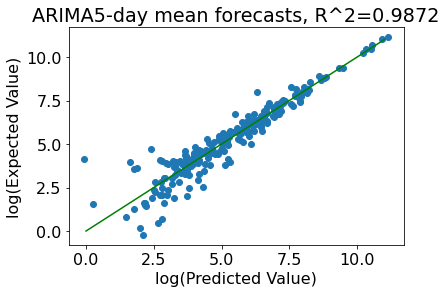

In [75]:
last = samples['train']['countries'][0]
x = []
preds = []
truths = []
buffer = 0
last = str(data.at[0, 'Country'])
for i in range(len(data)):
    if buffer > 0:
        buffer -= 1
        continue
        
    country = str(data.at[i, 'Country'])
    date = data.at[i, 'Date']
    cases = data.at[i, 'Cases']
    valid = data.at[i, 'Valid']
    
    if not valid:
        continue
    
    if last != country:
        x = []
    
    if country in test_dates and date in test_dates[country]:
        
        if i + 4 >= len(data) or data.at[i + 4, 'Country'] != country:
            continue
        
        model = ARIMA(x, order=(k, 0, n))
        model_fit = model.fit()

        pred = model_fit.forecast(steps=n)
        truth = np.array([data.at[i + j, 'Cases'] for j in range(5)])
        
        preds.append(np.mean(pred))
        truths.append(np.mean(truth))
        
        for j in range(5):
            x.append(float(data.at[i + j, 'Cases']))
        buffer += 4
        
        #print(i, date, country, x, pred, truth, preds[-1], truths[-1])
        print(i, 'of', len(data), preds[-1], truths[-1])
    else:
        x.append(float(cases))
    
    last = country

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


Text(0.5, 1.0, 'ARIMA 5-day mean forecasts, R^2=0.9872')

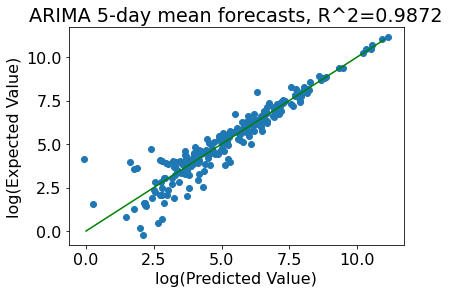

In [76]:
r2 = r2_score(truths, preds)
plt.scatter(np.log(preds), np.log(truths))
plt.plot([x for x in range(12)], [x for x in range(12)], color='green')
plt.xlabel('log(Predicted Value)')
plt.ylabel('log(Expected Value)')
plt.title('ARIMA ' + str(n) + '-day mean forecasts, R^2=' + str(round(r2, 4)))

In [ ]:
last = samples['train']['countries'][0]
x = []
preds = []
truths = []
buffer = 0
last = str(data.at[0, 'Country'])
for i in range(len(data)):
    if buffer > 0:
        buffer -= 1
        continue
        
    country = str(data.at[i, 'Country'])
    date = data.at[i, 'Date']
    cases = data.at[i, 'Cases']
    valid = data.at[i, 'Valid']
    
    if not valid:
        continue
    
    if last != country:
        x = []
    
    if country in test_dates and date in test_dates[country]:
        
        if i + 4 >= len(data) or data.at[i + 4, 'Country'] != country:
            continue
        
        model = ARIMA(x, order=(k, 0, n))
        model_fit = model.fit()

        pred = model_fit.forecast(steps=n)
        truth = np.array([data.at[i + j, 'Cases'] for j in range(5)])
        
        preds.append(np.mean(pred))
        truths.append(np.mean(truth))
        
        for j in range(5):
            x.append(float(data.at[i + j, 'Cases']))
        buffer += 4
        
        #print(i, date, country, x, pred, truth, preds[-1], truths[-1])
        print(i, 'of', len(data), preds[-1], truths[-1])
    else:
        x.append(float(cases))
    
    last = country